## Video Generation

In this notebook, I will be exploring an open source model that was recently launched on Huggingface and is specifically built for video generation via prompting. More information about this models can be found here: https://github.com/huggingface/diffusers/releases/tag/v0.30.0

## Installing dependencies

These models use the diffusers package to generate the videos hence the import

In [1]:
!pip install diffusers["torch"] transformers

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

## Latte

The first model that I will be exploring is the Latte model which is a generative model built to generate gifs corresponding to the input text(prompt). It generates these gifs by generating multiple cohesive photos which are then combined to make the GIF. During inference, this model uses about 24gb of GPU vram so A100 is required to run this model.

In [2]:
import torch
from diffusers import LattePipeline

pipeline = LattePipeline.from_pretrained(
	"maxin-cn/Latte-1", torch_dtype=torch.float16
).to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/418 [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

(…)ext_encoder/model.safetensors.index.json:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/414 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/780 [00:00<?, ?B/s]

tokenizer/added_tokens.json:   0%|          | 0.00/2.59k [00:00<?, ?B/s]

model-00001-of-00004.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00002-of-00004.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00004-of-00004.safetensors:   0%|          | 0.00/4.19G [00:00<?, ?B/s]

model-00003-of-00004.safetensors:   0%|          | 0.00/4.87G [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

transformer/config.json:   0%|          | 0.00/718 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/627 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/4.23G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/391M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
The config attributes {'attention_type': 'default', 'double_self_attention': False, 'norm_num_groups': 32, 'num_vector_embeds': None, 'only_cross_attention': False, 'upcast_attention': False, 'use_linear_projection': False} were passed to LatteTransformer3DModel, but are not expected and will be ignored. Please verify your config.json configuration file.
Some weights of the model checkpoint were not used when initializing LatteTransformer3DModel: 
 ['caption_projection.y_embedding']


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

After downloading the model I will create a pipeline that will take in the text and returns the generated video, I will then be exporting this video into a GIF.

In [3]:
import torch
from diffusers import LattePipeline
from diffusers.utils import export_to_gif

pipe = LattePipeline.from_pretrained("maxin-cn/Latte-1", torch_dtype=torch.float16).to("cuda")

pipe.enable_model_cpu_offload()                                 # Enable memory optimizations.

prompt = "A small cactus with a happy face in the Sahara desert."
videos = pipe(prompt).frames[0]
export_to_gif(videos, "latte.gif")

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
The config attributes {'attention_type': 'default', 'double_self_attention': False, 'norm_num_groups': 32, 'num_vector_embeds': None, 'only_cross_attention': False, 'upcast_attention': False, 'use_linear_projection': False} were passed to LatteTransformer3DModel, but are not expected and will be ignored. Please verify your config.json configuration file.
Some weights of the model checkpoint were not used when initializing LatteTransformer3DModel: 
 ['caption_projection.y_embedding']


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]


Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...

Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...


  0%|          | 0/50 [00:00<?, ?it/s]

'latte.gif'

Playing the first generated video

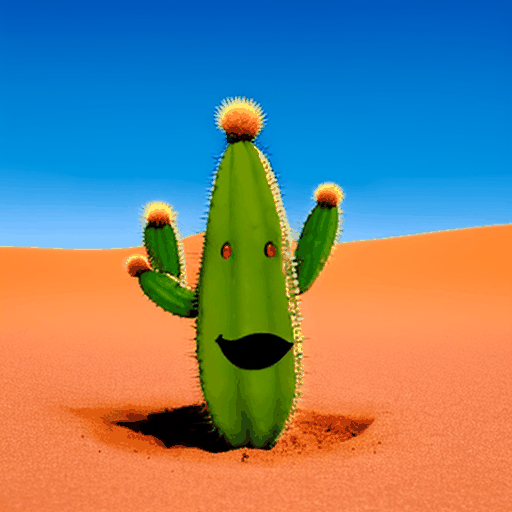

In [5]:
from IPython.display import Image

Image(filename='/content/latte.gif')


A simple function that takes in the prompt and the file name and saves the generated gif with that file name.

In [6]:
def create_gif(prompt, prompt_name):
  videos = pipe(prompt).frames[0]
  return export_to_gif(videos, f"{prompt_name}")

In [7]:
create_gif('A tiny robot dancing joyfully in a futuristic city at night', "robot.gif")


Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...

Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...


  0%|          | 0/50 [00:00<?, ?it/s]

'robot.gif'

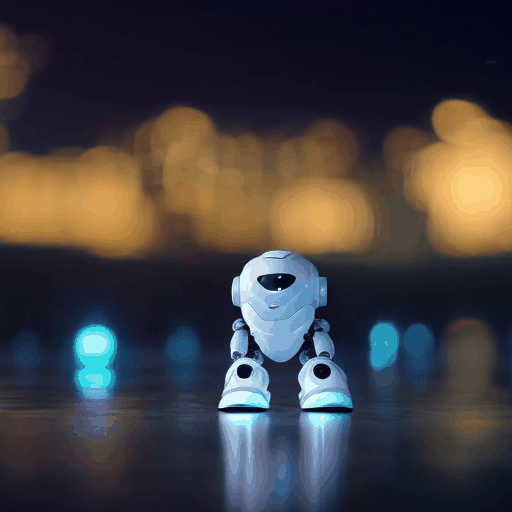

In [8]:
from IPython.display import Image

Image(filename='/content/robot.gif')


In [9]:
create_gif("A cute cat playing with a ball of yarn in a cozy living room", "cat.gif")


Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...

Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...


  0%|          | 0/50 [00:00<?, ?it/s]

'cat.gif'

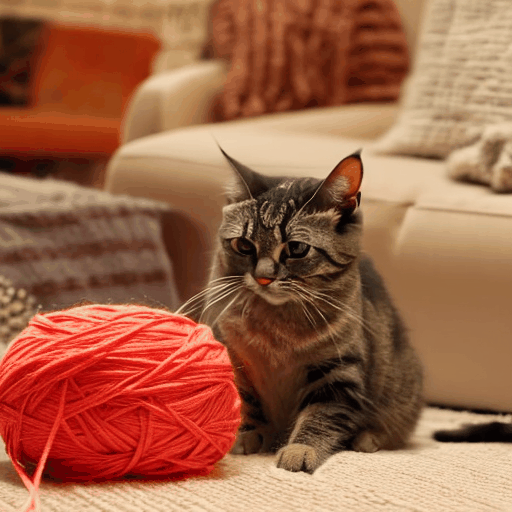

In [10]:
from IPython.display import Image

Image(filename='/content/cat.gif')


In [11]:
create_gif("A smiling sun wearing sunglasses over a tropical beach", "sun.gif")


Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...

Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...


  0%|          | 0/50 [00:00<?, ?it/s]

'sun.gif'

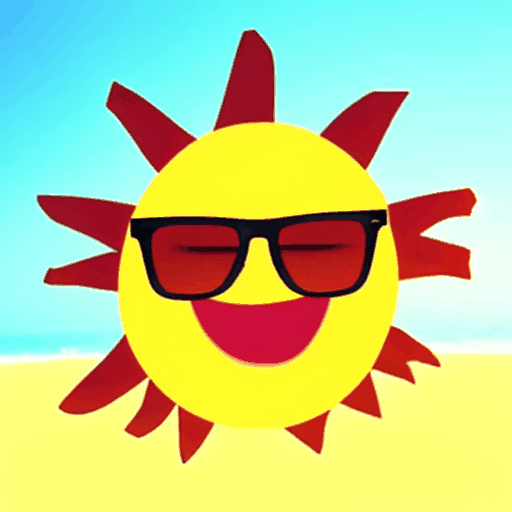

In [12]:
from IPython.display import Image

Image(filename='/content/sun.gif')


In [13]:
create_gif("A little dog wagging its tail in a beautiful garden full of flowers", "dog.gif")


Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...

Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...


  0%|          | 0/50 [00:00<?, ?it/s]

'dog.gif'

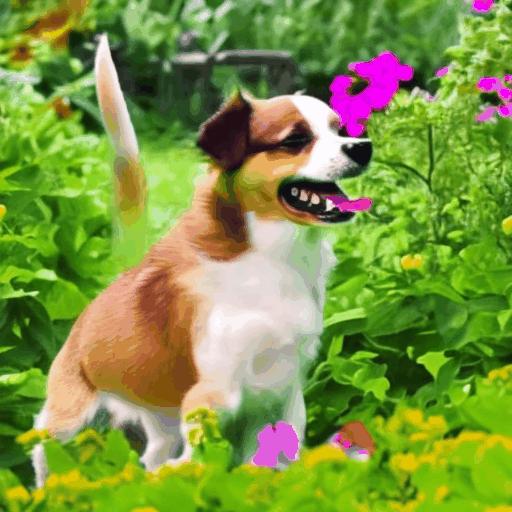

In [14]:
from IPython.display import Image

Image(filename='/content/dog.gif')


In [15]:
create_gif("A colorful butterfly fluttering over a field of blooming flowers", "butterfly.gif")


Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...

Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...


  0%|          | 0/50 [00:00<?, ?it/s]

'butterfly.gif'

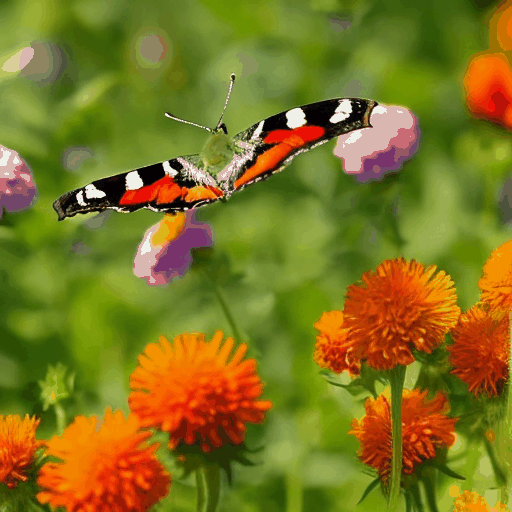

In [16]:
from IPython.display import Image

Image(filename='/content/butterfly.gif')


In [17]:
create_gif("A smiling moon in a starry night sky.", "moon.gif")


Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...

Setting `clean_caption=True` requires the ftfy library but it was not found in your environment. Checkout the instructions on the
installation section: https://github.com/rspeer/python-ftfy/tree/master#installing and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...


  0%|          | 0/50 [00:00<?, ?it/s]

'moon.gif'

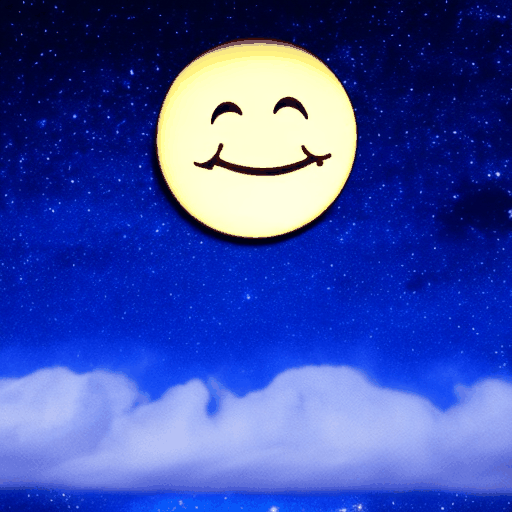

In [18]:
from IPython.display import Image

Image(filename='/content/moon.gif')


From the examples above we can see that this model produces really good gifs for an open source model and can be used to produce creative gifs wherever needed.